In [116]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import LabelEncoder, StandardScaler 
from scipy.stats import norm 
import os



In [128]:
file_path = r'C:\Users\avery\OneDrive\Documents\Image Data Excels\box_office_success_2015_2024_Updated.csv.xlsx'

df = pd.read_excel(file_path)

folder_location = r'C:\Users\avery\OneDrive\Documents\Random Regressor data'
os.makedirs(folder_location, exist_ok=True)


#file_path = r'C:\Users\avery\Downloads\box_office_success_2015_2024_Updated.csv (2).csv'

#try:
    # Use pd.read_csv() instead of pd.read_excel()
   # df = pd.read_csv(file_path)
   # print("Data loaded successfully from CSV!")
    #print(df.head())
#except FileNotFoundError:
    #print(f"Error: The file was not found at {file_path}")
    #print("Please check the file path.")
#except Exception as e:
    #print(f"An error occurred while reading the file: {e}")

df


,title,year,original_release_date_parsed,domestic_gross,international_gross,worldwide_gross,production_budget,profit_proxy,roi_proxy,tomatometer_rating,...,lead_actor_has_oscar,lead_actor_tier,lead_actor_status,star_power_score,is_animated,is_live_action,is_franchise,is_sequel,is_standalone,lead_actor_clean
0,Star Wars: Episode VII - The Force Awakens,2015,2015-12-18,936662225,1131561399,2068223624,533000000.0,1.535224e+09,2.880345,92.0,...,0,A,well_known,69.877836,0,1,1,1,0,daisy ridley john boyega harrison ford oscar i...
1,Jurassic World,2015,2015-06-12,652270625,1018130012,1670400637,150000000.0,1.520401e+09,10.136004,70.0,...,0,A,well_known,69.633508,0,1,1,0,0,chris pratt bryce dallas howard irrfan khan vi...
2,Furious 7,2015,2015-04-03,353007020,1162040651,1515047671,190000000.0,1.325048e+09,6.973935,82.0,...,0,A,well_known,69.389180,0,1,0,1,0,vin diesel paul walker dwayne johnson michelle...
3,Avengers: Age of Ultron,2015,2015-05-01,459005868,943800000,1402805868,280000000.0,1.122806e+09,4.010021,76.0,...,0,A,well_known,69.144852,0,1,1,0,0,robert downey jr. chris hemsworth mark ruffalo...
4,Minions,2015,2015-07-10,336045770,823352627,1159398397,74000000.0,1.085398e+09,14.667546,55.0,...,0,A,well_known,68.411867,1,0,0,0,1,sandra bullock jon hamm michael keaton allison...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
573,The Hunt,2020,2020-03-13,5812500,4737850,10550350,14000000.0,-3.449650e+06,-0.246404,57.0,...,0,C,trending,0.610820,0,1,0,0,1,betty gilpin emma roberts hilary swank amy mad...
574,Antebellum,2020,2020-08-21,0,7792716,7792716,10000000.0,-2.207284e+06,-0.220728,28.0,...,0,C,trending,0.488656,0,1,0,0,1,arabella landrum jena malone eric lange janell...
575,Bill & Ted Face the Music,2020,2020-08-28,3439660,2834367,6274027,25000000.0,-1.872597e+07,-0.749039,82.0,...,0,C,trending,0.366492,0,1,0,0,1,jack haven alex winter samara weaving bridget ...
576,The Rhythm Section,2020,2020-01-31,5437971,551612,5989583,50000000.0,-4.401042e+07,-0.880208,28.0,...,0,C,trending,0.244328,0,1,0,0,1,blake lively jude law sterling k. brown richar...


In [135]:
df["lead_actor"] = df["lead_actor"].str.split(",").str[0].str.strip()
X_features = ['domestic_gross', 'international_gross', 'production_budget', 'profit_proxy',
              'tomatometer_rating', 'tomatometer_count', 'genres', 'runtime', 'directors',
              'lead_actor', 'lead_actor_has_oscar', 'lead_actor_tier', 'lead_actor_status',
              'star_power_score', 'is_animated', 'is_live_action', 'is_franchise',
              'is_sequel', 'is_standalone', 'lead_actor_clean']
X = df[X_features]
y = df['roi_proxy']
X_encoded = pd.get_dummies(X, columns=['genres', 'directors', 'lead_actor', 'lead_actor_tier', 'lead_actor_status','lead_actor_clean'], drop_first=True)



In [136]:

X_train, X_test, y_train, y_test = train_test_split(X_encoded, y, test_size=0.2, random_state=42)
scaler = StandardScaler()

X_train_scaled = scaler.fit_transform(X_train)

X_test_scaled = scaler.transform(X_test)
h = RandomForestRegressor(random_state=42, n_estimators=100) 

In [137]:
h.fit(X_train_scaled , y_train)
y_pred = h.predict(X_test_scaled)
mse = mean_squared_error(y_test, y_pred)

print(f"Mean Squared Error: **{mse}**")

Mean Squared Error: **17.582569354485766**


In [124]:
individual_tree_predictions = [tree.predict(X_test_scaled) for tree in h.estimators_]
individual_tree_predictions = np.array(individual_tree_predictions)

# 2. Calculate the standard deviation across all trees
prediction_stdev = np.std(individual_tree_predictions, axis=0)

# 3. DataFrame summary
results_df = pd.DataFrame({
    'Actual': y_test,
    'Predicted': y_pred,
    'StdDev_Uncertainty': prediction_stdev
})

# Example of a 95% confidence 
results_df['Lower_Bound_95ci'] = results_df['Predicted'] - 1.96 * results_df['StdDev_Uncertainty']
results_df['Upper_Bound_95ci'] = results_df['Predicted'] + 1.96 * results_df['StdDev_Uncertainty']



def calculate_confidence_percentage(row):
   
    if row['StdDev_Uncertainty'] == 0:
        # Handle cases where all trees predict the exact same value (perfect certainty)
    
        return 100.0
    
    # Calculate the Z-scores 
    actual_value = row['Actual']
    predicted_mean = row['Predicted']
    std_dev = row['StdDev_Uncertainty']
#normlized score
    max_stdev = results_df['StdDev_Uncertainty'].max()
    
    if max_stdev == 0:
         return 100.0
         
    # Normalized
    normalized_uncertainty = row['StdDev_Uncertainty'] / max_stdev
    # Confidence Percentage 
    confidence_score = 100 * (1 - normalized_uncertainty)
    
    return confidence_score


# Apply the new scoring function
results_df['Confidence_Percentage'] = results_df.apply(calculate_confidence_percentage, axis=1)

print("\nPrediction Results Confidence Percentage (0-100):")

print(results_df[['Actual', 'Predicted', 'StdDev_Uncertainty', 'Confidence_Percentage']].head())

folder_location = r'C:\Users\avery\OneDrive\Documents\Random Regressor data'
file_name = 'prediction_results_summary.csv'
full_path = os.path.join(folder_location, file_name)

# Ensure the directory exists before trying to save
os.makedirs(folder_location, exist_ok=True)

try:
    results_df.to_csv(full_path, index=False)
    print(f"\nSuccessfully saved results to: {full_path}")
except IOError as e:
    print(f"\nError saving file to {full_path}: {e}")
    print("Please check file permissions or if the path exists.")



Prediction Results Confidence Percentage (0-100):
        Actual     Predicted  StdDev_Uncertainty  Confidence_Percentage
257  526045546  5.270082e+08        1.303518e+07              97.575083
574    7792716  8.314258e+06        4.647038e+06              99.135518
485  203044905  2.022420e+08        3.450333e+06              99.358139
101   40272135  4.039235e+07        5.449708e+05              99.898620
566   28588425  2.808028e+07        6.339274e+05              99.882071

Successfully saved results to: C:\Users\avery\OneDrive\Documents\Random Regressor data\prediction_results_summary.csv


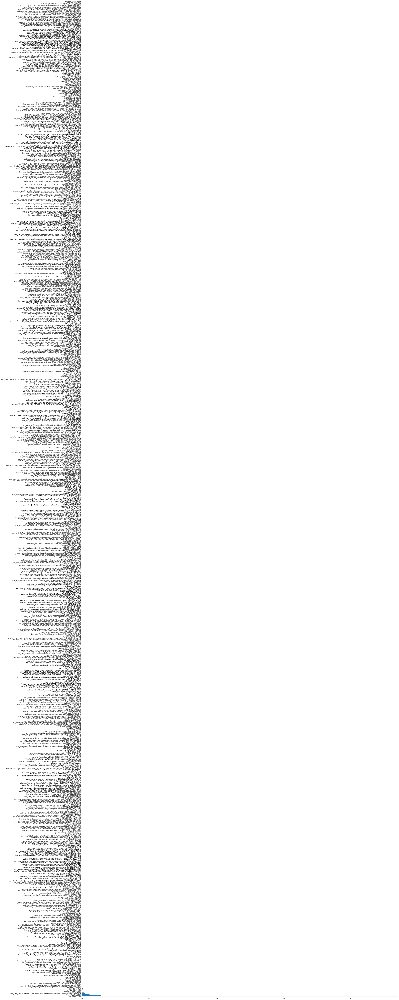

In [125]:
model_ranks=pd.Series(h.feature_importances_,index=X_train.columns,name="Importance").sort_values(ascending=False)
plt.figure(figsize=(40,100))
ax=model_ranks.plot(kind='barh')
plt.tight_layout()
plt.show()


Displaying top 231 features (top 20%).


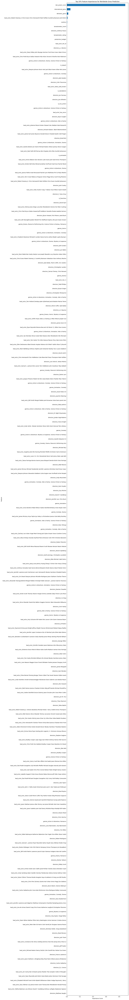

In [110]:
num_top_features = max(1, int(len(model_ranks) * 0.20)) 

# Filter the series to keep only the top 20%
top_20_percent_features = model_ranks.head(num_top_features)

print(f"\nDisplaying top {num_top_features} features (top 20%).")

# Plotting only the top features
plt.figure(figsize=(15, num_top_features * 0.5)) # Dynamically adjust figure size
ax = top_20_percent_features.plot(kind='barh')
plt.title('Top 20% Feature Importances for Worldwide Gross Prediction')
plt.xlabel('Importance Score')
plt.ylabel('Feature')
plt.gca().invert_yaxis() # Invert y-axis so the most important feature is at the top
plt.tight_layout()
plt.show()

Saved top actors graph to: C:\Users\avery\OneDrive\Documents\Random Regressor data\top_actors_importance.png


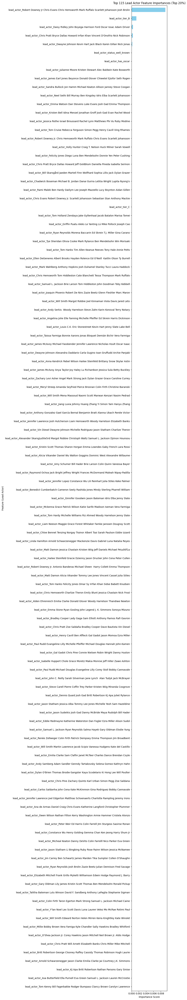

Saved bottom actors graph to: C:\Users\avery\OneDrive\Documents\Random Regressor data\bottom_actors_importance.png


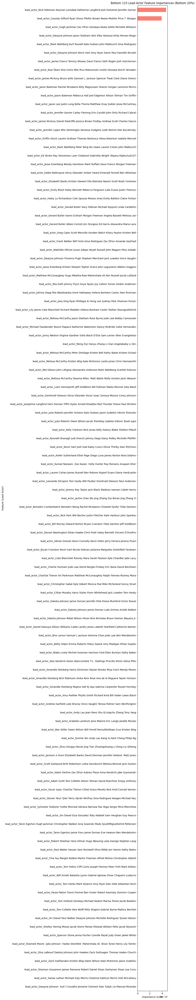

In [129]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

h = RandomForestRegressor(random_state=42) 
h.fit(X_train_scaled, y_train)

# Get feature importances as a sorted Series
model_ranks = pd.Series(h.feature_importances_, index=X_train.columns, name="Importance").sort_values(ascending=False)


lead_actor_features = model_ranks[model_ranks.index.str.startswith('lead_actor_')]

# Select top and botom 20%
num_top_bottom = max(1, int(len(lead_actor_features) * 0.20)) 

# Select top and bottom 20%
top_actors = lead_actor_features.head(num_top_bottom)
# Sort ascending
bottom_actors = lead_actor_features.sort_values(ascending=True).head(num_top_bottom).sort_values(ascending=False)

# Plotting the top 20%
plt.figure(figsize=(10, num_top_bottom * 0.5 + 1))
top_actors.plot(kind='barh', color='skyblue')
plt.title(f'Top {num_top_bottom} Lead Actor Feature Importances (Top 20%)')
plt.xlabel('Importance Score')
plt.ylabel('Feature (Lead Actor)')
plt.gca().invert_yaxis()
plt.tight_layout()
top_graph_path = os.path.join(folder_location, 'top_actors_importance.png')
plt.savefig(top_graph_path)
print(f"Saved top actors graph to: {top_graph_path}")
plt.show()

# Plotting the bottom 20%
plt.figure(figsize=(10, num_top_bottom * 0.5 + 1))
bottom_actors.plot(kind='barh', color='salmon')
plt.title(f'Bottom {num_top_bottom} Lead Actor Feature Importances (Bottom 20%)')
plt.xlabel('Importance Score')
plt.ylabel('Feature (Lead Actor)')
plt.gca().invert_yaxis()
plt.tight_layout()
bottom_graph_path = os.path.join(folder_location, 'bottom_actors_importance.png')
plt.savefig(bottom_graph_path)
print(f"Saved bottom actors graph to: {bottom_graph_path}")
plt.show()

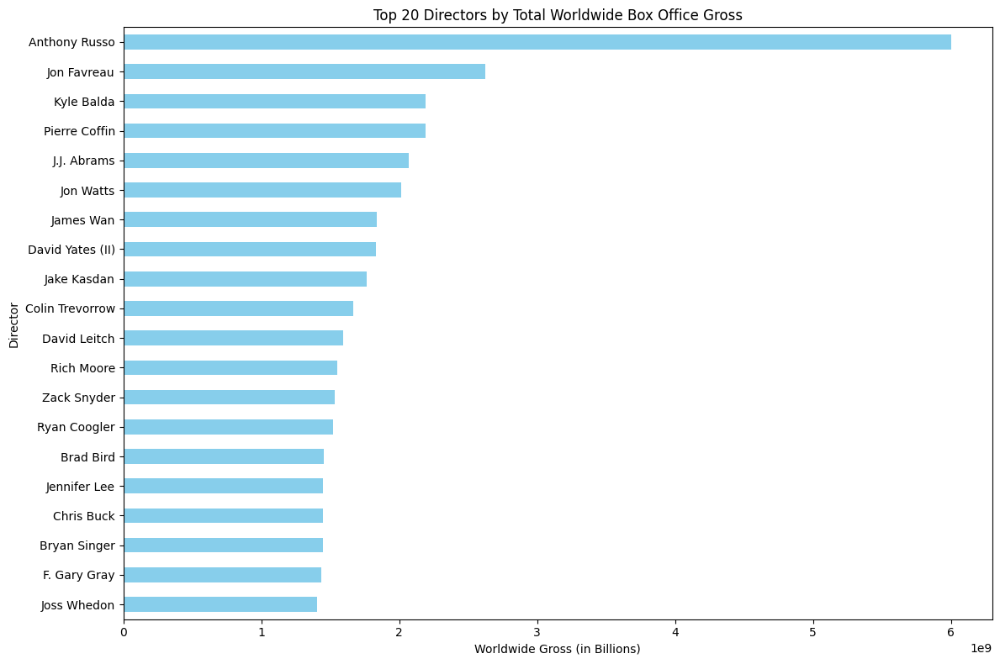

Average Worldwide Gross per Director:
directors
J.J. Abrams        2.068224e+09
Anthony Russo      2.000365e+09
Colin Trevorrow    1.670401e+09
Chris Buck         1.450027e+09
Jennifer Lee       1.450027e+09
                       ...     
Christoper Renz    7.792716e+06
Gerard Bush        7.792716e+06
Dean Parisot       6.274027e+06
Reed Morano        5.989583e+06
Peter Cattaneo     4.890505e+06
Name: worldwide_gross, Length: 521, dtype: float64
Saved bottom actors graph to: C:\Users\avery\OneDrive\Documents\Random Regressor data\Director Average Worldwide Gross.png


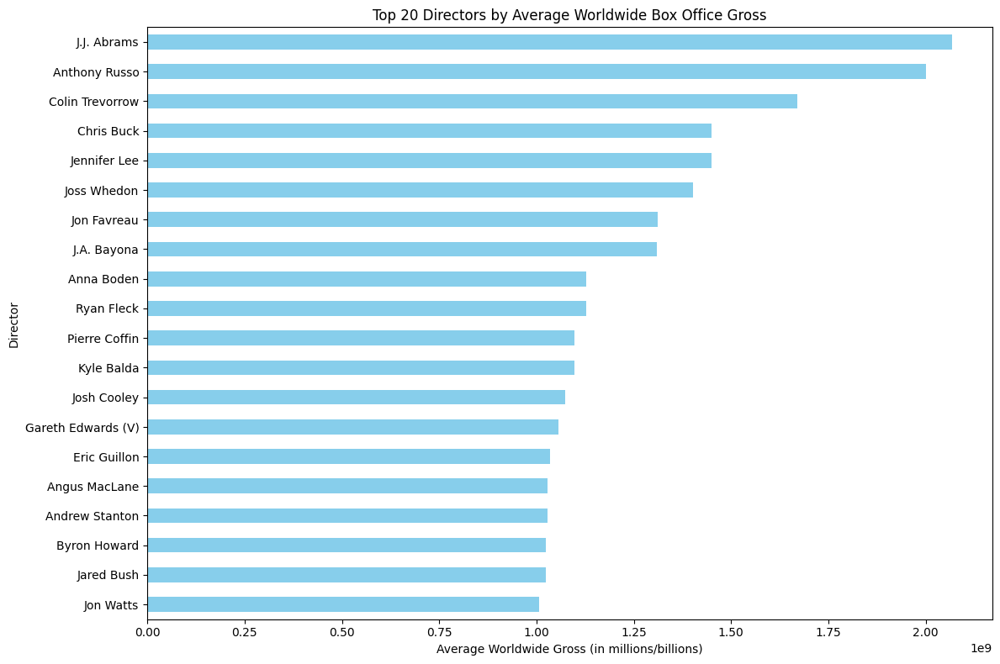

In [143]:
df_directors = df.dropna(subset=['directors']).assign(
    directors=lambda x: x['directors'].astype(str).str.split(r'\s*,\s*')
).explode('directors')

director_gross = df_directors.groupby('directors')['worldwide_gross'].sum().sort_values(ascending=False)

# 2. Top 20% of Directprs 
top_n = 20
top_directors_gross = director_gross.head(top_n)

# 3. Bar Chart
plt.figure(figsize=(12, 8))
top_directors_gross.plot(kind='barh', color='skyblue')
plt.xlabel('Worldwide Gross (in Billions)')
plt.ylabel('Director')
plt.title(f'Top {top_n} Directors by Total Worldwide Box Office Gross')
plt.gca().invert_yaxis() # Invert y-axis to have the highest grossing at the top
plt.tight_layout()
plt.show()

df_directors = df.dropna(subset=['directors']).assign(
    directors=lambda x: x['directors'].astype(str).str.split(r'\s*,\s*')
).explode('directors')

# average worldwide gross per director
director_avg_gross = df_directors.groupby('directors')['worldwide_gross'].mean().sort_values(ascending=False)

print("Average Worldwide Gross per Director:")
print(director_avg_gross)

# 3. bar chart
plt.figure(figsize=(12, 8))
top_directors_avg_gross.plot(kind='barh', color='skyblue')
plt.xlabel('Average Worldwide Gross (in millions/billions)')
plt.ylabel('Director')
plt.title(f'Top {top_n} Directors by Average Worldwide Box Office Gross')
plt.gca().invert_yaxis() # Invert y-axis to have the highest grossing at the top
plt.tight_layout()
director_avg_wolrdwide_gross_path = os.path.join(folder_location, 'Director Average Worldwide Gross.png')
plt.savefig(director_avg_wolrdwide_gross_path)
print(f"Saved bottom actors graph to: {director_avg_wolrdwide_gross_path}")
plt.show()


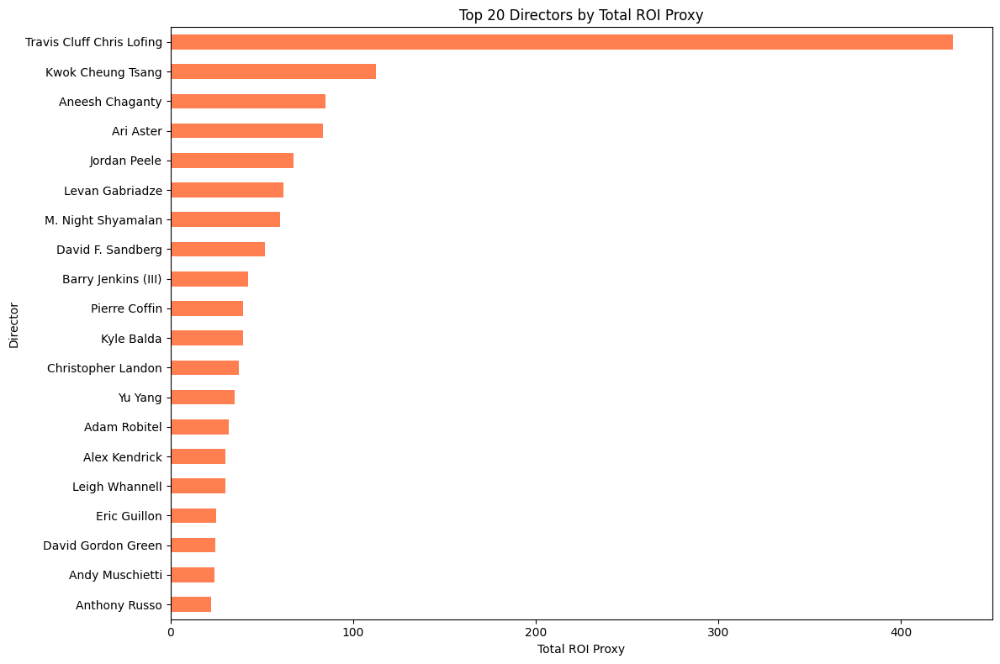

Average ROI Proxy per Director:
directors
Travis Cluff Chris Lofing    428.644100
Kwok Cheung Tsang            112.656822
Aneesh Chaganty               84.752315
Levan Gabriadze               61.882090
Barry Jenkins (III)           42.448407
Name: roi_proxy, dtype: float64


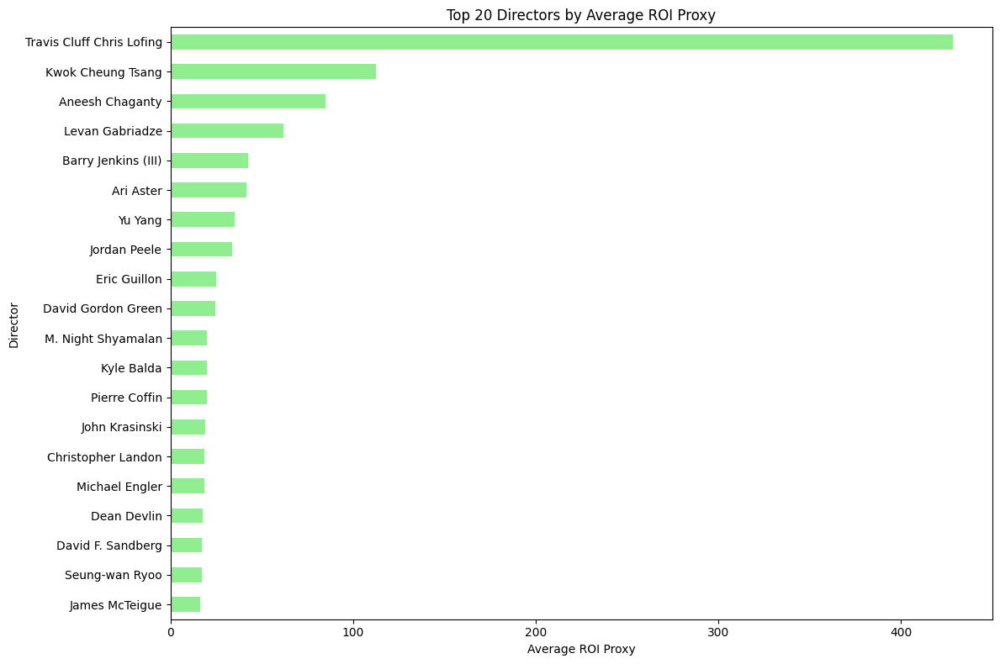

In [140]:
df_directors = df.dropna(subset=['directors']).assign(
    directors=lambda x: x['directors'].astype(str).str.split(r'\s*,\s*')
).explode('directors')

# Calculate total roi_proxy per director
director_roi_proxy_total = df_directors.groupby('directors')['roi_proxy'].sum().sort_values(ascending=False)

# 2. Top 20% of Directors (You might want to define 'top_n' based on count or use a fixed number)
top_n = 20
top_directors_roi_total = director_roi_proxy_total.head(top_n)

# 3. Bar Chart for Total ROI Proxy
plt.figure(figsize=(12, 8))
top_directors_roi_total.plot(kind='barh', color='coral')
plt.xlabel('Total ROI Proxy')
plt.ylabel('Director')
plt.title(f'Top {top_n} Directors by Total ROI Proxy')
plt.gca().invert_yaxis() # Invert y-axis to have the highest value at the top
plt.tight_layout()
plt.show()

# --- Analysis 2: Average ROI Proxy per Director ---

# Ensure df_directors is available if the first block wasn't run
df_directors = df.dropna(subset=['directors']).assign(
    directors=lambda x: x['directors'].astype(str).str.split(r'\s*,\s*')
).explode('directors')

# Calculate average roi_proxy per director
director_avg_roi_proxy = df_directors.groupby('directors')['roi_proxy'].mean().sort_values(ascending=False)

print("Average ROI Proxy per Director:")
print(director_avg_roi_proxy.head()) # Print top few for checking

# 3. Bar chart for Average ROI Proxy
# Using the same 'top_n' definition
top_directors_avg_roi_proxy = director_avg_roi_proxy.head(top_n)

plt.figure(figsize=(12, 8))
top_directors_avg_roi_proxy.plot(kind='barh', color='lightgreen')
plt.xlabel('Average ROI Proxy')
plt.ylabel('Director')
plt.title(f'Top {top_n} Directors by Average ROI Proxy')
plt.gca().invert_yaxis() # Invert y-axis to have the highest value at the top
plt.tight_layout()
plt.show()

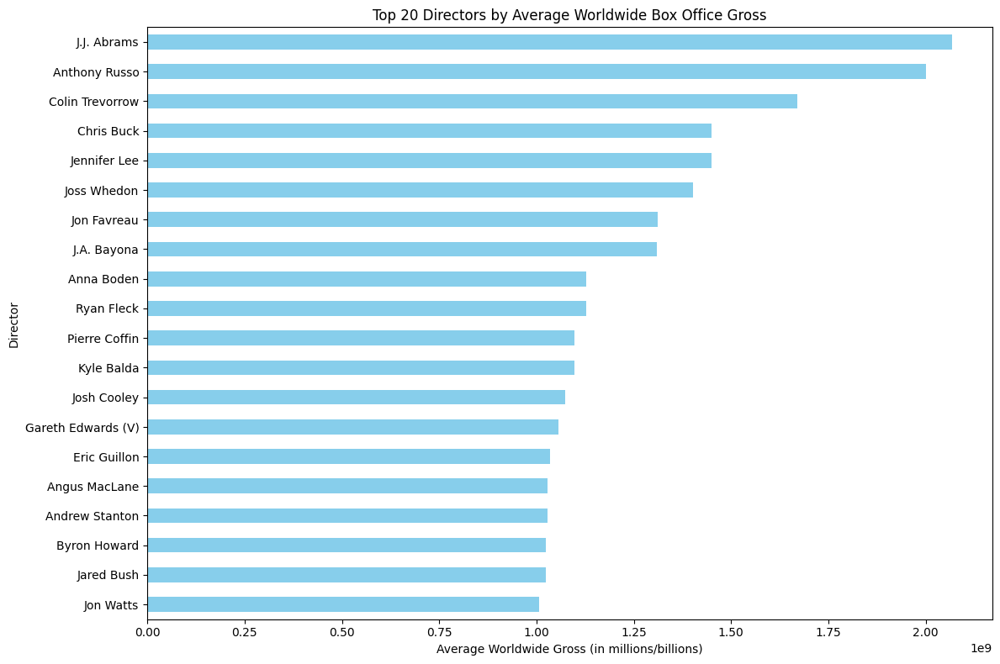

In [113]:
df_directors = df.dropna(subset=['directors']).assign(
    directors=lambda x: x['directors'].astype(str).str.split(r'\s*,\s*')
).explode('directors')

director_avg_gross = df_directors.groupby('directors')['worldwide_gross'].mean().sort_values(ascending=False)

# 2. Select top N directors for better visualization (optional)
top_n = 20
top_directors_avg_gross = director_avg_gross.head(top_n)

#bar Chart Format
plt.figure(figsize=(12, 8))
top_directors_avg_gross.plot(kind='barh', color='skyblue')
plt.xlabel('Average Worldwide Gross (in millions/billions)')
plt.ylabel('Director')
plt.title(f'Top {top_n} Directors by Average Worldwide Box Office Gross')
plt.gca().invert_yaxis() # Invert y-axis to have the highest grossing at the top
plt.tight_layout()
plt.show()

Saved top actors graph to: C:\Users\avery\OneDrive\Documents\Random Regressor data\top_starpower_worldwide_path.png


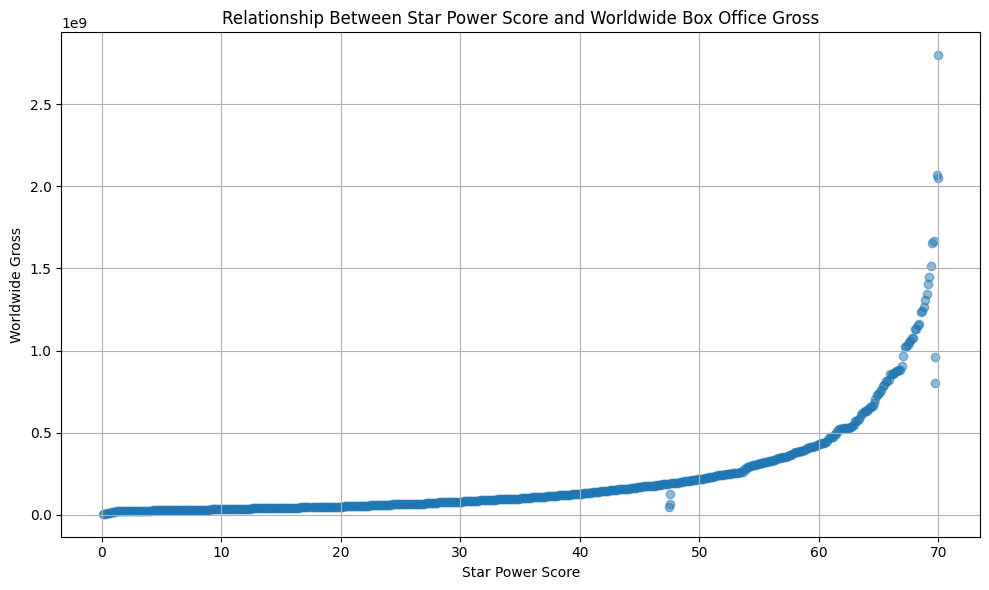

Saved bottom actors graph to: C:\Users\avery\OneDrive\Documents\Random Regressor data\Star Power Score and ROI Proxy.png


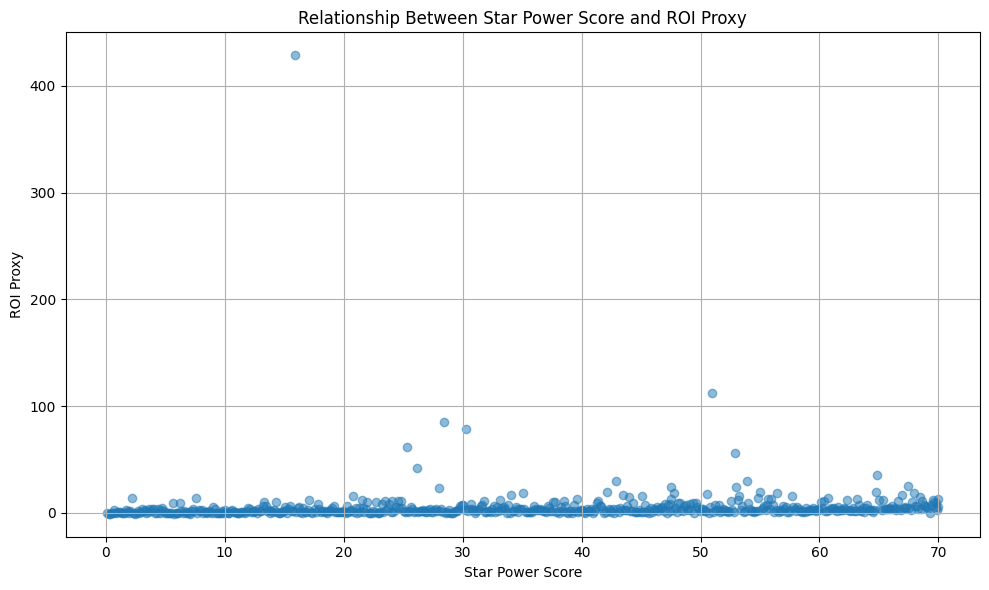

In [144]:
df_plot = df.dropna(subset=['star_power_score', 'worldwide_gross'])

# Create the scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(df_plot['star_power_score'], df_plot['worldwide_gross'], alpha=0.5)
plt.title('Relationship Between Star Power Score and Worldwide Box Office Gross')
plt.xlabel('Star Power Score')
plt.ylabel('Worldwide Gross')
plt.grid(True)
plt.tight_layout()
top_starpower_worldwide_path = os.path.join(folder_location, 'top_starpower_worldwide_path.png')
plt.savefig(top_DirectorActot_path)
print(f"Saved top actors graph to: {top_starpower_worldwide_path}")
plt.show()

df_plot = df.dropna(subset=['star_power_score', 'roi_proxy'])

# Create the scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(df_plot['star_power_score'], df_plot['roi_proxy'], alpha=0.5)
plt.title('Relationship Between Star Power Score and ROI Proxy')
plt.xlabel('Star Power Score')
plt.ylabel('ROI Proxy')
plt.grid(True)
plt.tight_layout()
roi_proxy_and_Starpower_path = os.path.join(folder_location, 'Star Power Score and ROI Proxy.png')
plt.savefig(roi_proxy_and_Starpower_path)
print(f"Saved bottom actors graph to: {roi_proxy_and_Starpower_path}")
plt.show()

C:\Users\avery\AppData\Local\Temp\ipykernel_2156\2702487575.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column_name] = df[column_name].astype(str).str.strip().str.split(',')
C:\Users\avery\AppData\Local\Temp\ipykernel_2156\2702487575.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column_name] = df[column_name].astype(str).str.strip().str.split(',')


Saved top actors graph to: C:\Users\avery\OneDrive\Documents\Random Regressor data\top_Director_actor_pairs.png


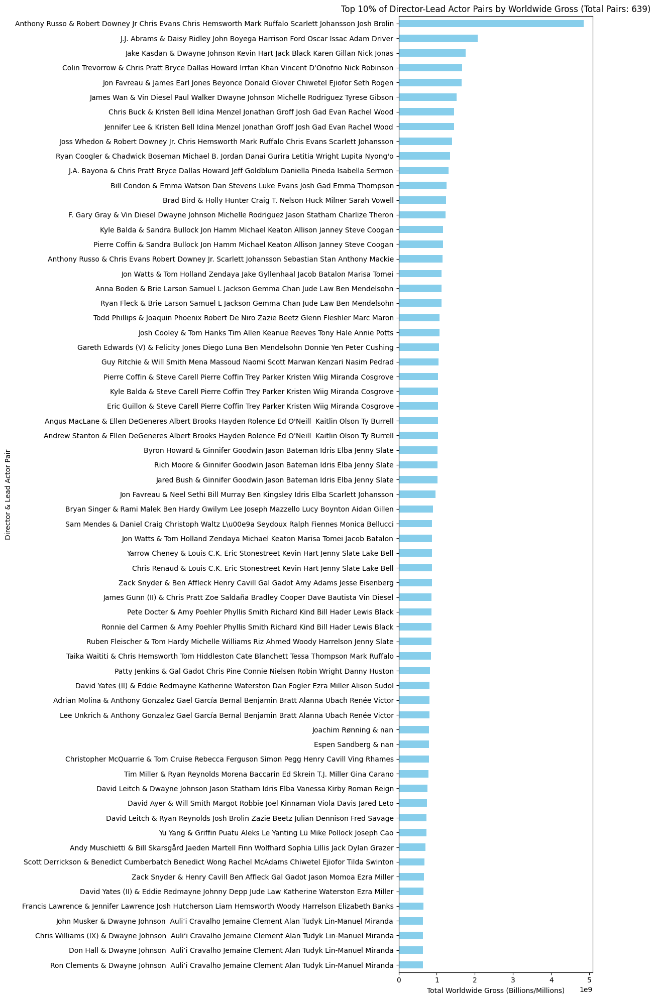

In [130]:
required_cols = ['directors', 'lead_actor', 'worldwide_gross']
if not all(col in df.columns for col in required_cols):
    print(f"Error: Missing one of the required columns {required_cols}")
    exit()
df['worldwide_gross'] = pd.to_numeric(df['worldwide_gross'], errors='coerce')


# --- 2. Clean and Explode Data ---
# Function to clean and split comma-separated columns
def clean_and_split(df, column_name):
    df[column_name] = df[column_name].astype(str).str.strip().str.split(',')
    df = df.explode(column_name)
    df[column_name] = df[column_name].str.strip()
    return df

df_directors = clean_and_split(df[['directors', 'worldwide_gross']], 'directors')
df_actors = clean_and_split(df[['lead_actor', 'worldwide_gross']], 'lead_actor')

# Merge back using specific suffixes for the 'worldwide_gross' columns
df_exploded_pairs = pd.merge(
    df_directors, 
    df_actors, 
    left_index=True, 
    right_index=True, 
    suffixes=('_dir_gross', '_actor_gross')
)

# Create a combined 'Director & Actor' pair string
# The column names for directors/actors themselves were unique so they don't have suffixes
df_exploded_pairs['Director & Actor'] = df_exploded_pairs['directors'] + ' & ' + df_exploded_pairs['lead_actor']


# --- 3. Aggregate Gross by Pair ---
# Now reference the correct, suffixed gross column from the left side of the merge
pair_gross = df_exploded_pairs.groupby('Director & Actor')['worldwide_gross_dir_gross'].sum().sort_values(ascending=False)


# --- 4. Filter for Top 20% ---
top_20_percentile_threshold = pair_gross.quantile(0.9)
top_pairs = pair_gross[pair_gross >= top_20_percentile_threshold]


# --- 5. Create Graph ---
plt.figure(figsize=(12, 20))
top_pairs.plot(kind='barh', color='skyblue')
plt.xlabel('Total Worldwide Gross (Billions/Millions)')
plt.ylabel('Director & Lead Actor Pair')
plt.title(f'Top 10% of Director-Lead Actor Pairs by Worldwide Gross (Total Pairs: {len(pair_gross)})')
plt.gca().invert_yaxis()
plt.tight_layout()
top_DirectorActot_path = os.path.join(folder_location, 'top_Director_actor_pairs.png')
plt.savefig(top_DirectorActot_path)
print(f"Saved top actors graph to: {top_DirectorActot_path}")